In [1]:
%matplotlib inline
import os

import rasterio
import random
import json
import sys
import datacube
import matplotlib
import geopandas as gpd
import numpy as np
import pandas as pd
import xarray as xr
from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from geopy.geocoders import Nominatim 
from shapely import speedups
from shapely.geometry import Point, Polygon, LineString
from shapely.ops import triangulate
from shapely.strtree import STRtree
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from deafrica_tools.plotting import display_map, map_shapefile, plot_lulc, rgb
from deafrica_tools.datahandling import load_ard, mostcommon_crs
from deafrica_tools.bandindices import calculate_indices
from deafrica_tools.coastal import tidal_tag
from deafrica_tools.dask import create_local_dask_cluster
from datacube.utils.geometry import Geometry
from deafrica_tools.spatial import xr_rasterize

import matplotlib.colors as mcolors

In [2]:
create_local_dask_cluster()

/usr/local/lib/python3.10/dist-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 41759 instead
  warnings.warn(
INFO:distributed.scheduler:State start
INFO:distributed.scheduler:  Scheduler at:     tcp://127.0.0.1:38521
INFO:distributed.scheduler:  dashboard at:           127.0.0.1:41759
INFO:distributed.nanny:        Start Nanny at: 'tcp://127.0.0.1:38043'
INFO:distributed.scheduler:Register worker <WorkerState 'tcp://127.0.0.1:43851', name: 0, status: init, memory: 0, processing: 0>
INFO:distributed.scheduler:Starting worker compute stream, tcp://127.0.0.1:43851
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:40486
INFO:distributed.scheduler:Receive client connection: Client-fa4a6a53-2f14-11ef-84a3-e2006f404ac1
INFO:distributed.core:Starting established connection to tcp://127.0.0.1:40498


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/ndeye.fatou.sane28@gmail.com/proxy/41759/status,
Dashboard: /user/ndeye.fatou.sane28@gmail.com/proxy/41759/status,Workers: 1
Total threads: 15,Total memory: 97.21 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38521,Workers: 1
Dashboard: /user/ndeye.fatou.sane28@gmail.com/proxy/41759/status,Total threads: 15
Started: Just now,Total memory: 97.21 GiB
Comm: tcp://127.0.0.1:43851,Total threads: 15
Dashboard: /user/ndeye.fatou.sane28@gmail.com/proxy/40229/status,Memory: 97.21 GiB
Nanny: tcp://127.0.0.1:38043,


In [3]:
dc = datacube.Datacube(app="Monitoring_seagrass")

In [4]:
AMPs_SN = gpd.read_file("AMP_SN_2023.geojson").set_crs(32628)

In [5]:
#AMPs_SN

In [6]:
idx = AMPs_SN[AMPs_SN['APNAME'] == "Somone"].index[0]
geom = Geometry(geom=AMPs_SN.iloc[idx].geometry, crs=AMPs_SN.crs)

In [7]:
gdf = AMPs_SN[AMPs_SN['APNAME'] == "Somone"].set_crs(32628)
map_shapefile(gdf, attribute = 'APNAME')

Label(value='')

Map(center=[14.501419633643806, -17.09514418085054], controls=(ZoomControl(options=['position', 'zoom_in_text'…

In [8]:
time = ("2023-01", "2023-03") 
sample_frequency="5D" 
tide_range = (0.25, 0.75)  # tide_range = (0.25, 0.75)

In [9]:
# Create a reusable query

query = {
    "geopolygon": geom,
    "resolution": (-10, 10),
    "output_crs":"EPSG:32628",
    "group_by": "solar_day",
    "time": time,
     
    }


# Load available data from Sentinel-2A and -2B and filter to retain only times
# with at least 80% good data
sentinel_2_ds = load_ard(dc=dc, 
              products=["s2_l2a"],
              min_gooddata=0.9,
              measurements =["red_edge_1", "red","green","blue","nir"],      
              
              **query)
# min_gooddata=0.9,

Using pixel quality parameters for Sentinel 2
Finding datasets
    s2_l2a
Counting good quality pixels for each time step


/usr/local/lib/python3.10/dist-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


Filtering to 12 out of 18 time steps with at least 90.0% good quality pixels
Applying pixel quality/cloud mask
Loading 12 time steps


In [10]:
#sentinel_2_ds

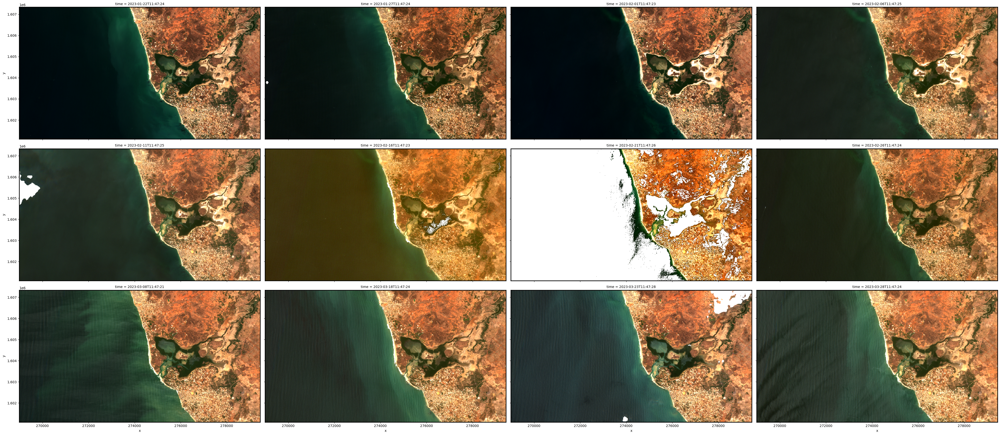

In [11]:
rgb(sentinel_2_ds,col='time')

In [12]:
sentinel_2_ds_low=sentinel_2_ds.sel(time='2023-02-16')

In [13]:
sentinel_2_ds_high=sentinel_2_ds.sel(time='2023-03-08')

## Compute band indices
This study measures the presence of water through the normalised difference water index (NDWI), submerged seagrasses through the Submerged Seagrasses Identification Index (SSII) and the non submerged seagrasses through the normalised difference vegetation index (NDVI).

NDWI is calculated from the green and near infrared (NIR) bands to identify water.
The formula is

$$
\begin{aligned}
\text{NDWI} = \frac{\text{Green} - \text{NIR}}{\text{Green} + \text{NIR}}.
\end{aligned}
$$

NDVI is calculated from the red and near infrared (NIR) bands to identify non submerged seagrasses.
The formula is

$$
\begin{aligned}
\text{NDVI} = \frac{\text{Red} - \text{NIR}}{\text{Red} + \text{NIR}}.
\end{aligned}
$$

SSII is calculated from the  first vegetation red edge band, and a is the adjustment factor, which takes a very small value to 
ensure that the denominator is not 0. The value of 0.00001 was taken in the experiment described in this study. [Li and all (2023)](https://doi.org/10.1016/j.marenvres.2023.105880)
The formula is

$$
\begin{aligned}
\text{SSII} = \frac{\text{Red edge 1} }{\text{Red} + \text{a}}.
\end{aligned}
$$

In [14]:
# Calculate MNDWI and add it to the loaded data set
sentinel_2_ds_low = calculate_indices(sentinel_2_ds_low, index="NDWI", collection="s2")
sentinel_2_ds_high = calculate_indices(sentinel_2_ds_high, index="NDWI", collection="s2")

# Calculate NDVI and add it to the loaded data set
sentinel_2_ds_low = calculate_indices(sentinel_2_ds_low, index="NDVI", collection="s2")

/tmp/ipykernel_1187/2459486676.py:2: DeprecationWarning: `collection` was deprecated in version 0.1.7. Use `satelite_mission` instead.
  sentinel_2_ds_low = calculate_indices(sentinel_2_ds_low, index="NDWI", collection="s2")
/tmp/ipykernel_1187/2459486676.py:3: DeprecationWarning: `collection` was deprecated in version 0.1.7. Use `satelite_mission` instead.
  sentinel_2_ds_high = calculate_indices(sentinel_2_ds_high, index="NDWI", collection="s2")
/tmp/ipykernel_1187/2459486676.py:6: DeprecationWarning: `collection` was deprecated in version 0.1.7. Use `satelite_mission` instead.
  sentinel_2_ds_low = calculate_indices(sentinel_2_ds_low, index="NDVI", collection="s2")


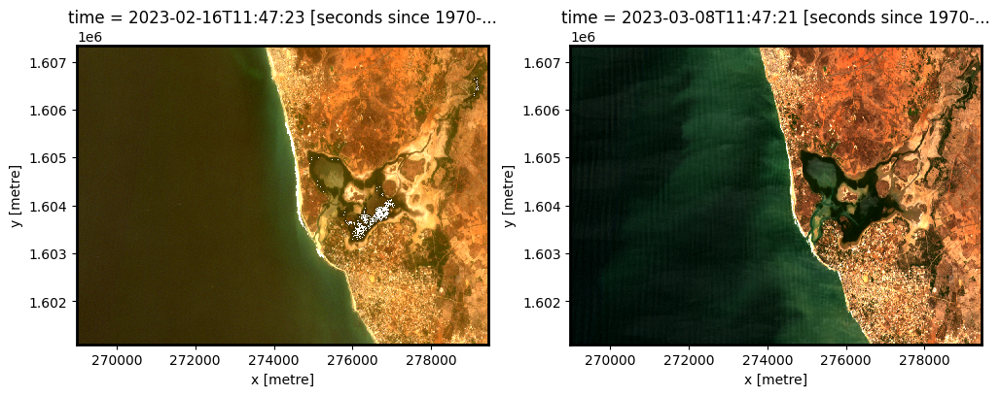

In [15]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

rgb(sentinel_2_ds_low, bands=["red", "green", "blue"], ax=ax[0])
rgb(sentinel_2_ds_high, bands=["red", "green", "blue"], ax=ax[1])

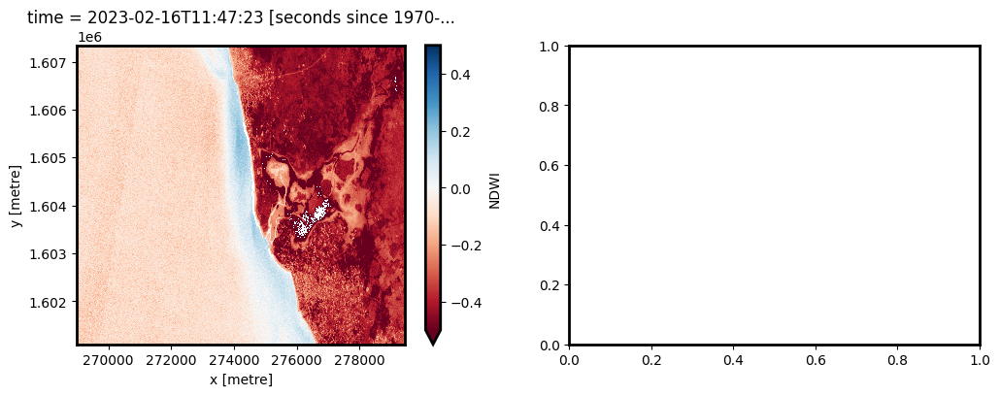

In [16]:
# Plot the resulting image for the same timestep selected above
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
sentinel_2_ds_low.NDWI.plot(ax=ax[0], cmap='RdBu', vmin=-0.5, vmax=0.5)
plt.show()

sentinel_2_ds_high.NDWI.plot(ax=ax[1], cmap='RdBu', vmin=-0.5, vmax=0.5)
plt.show()

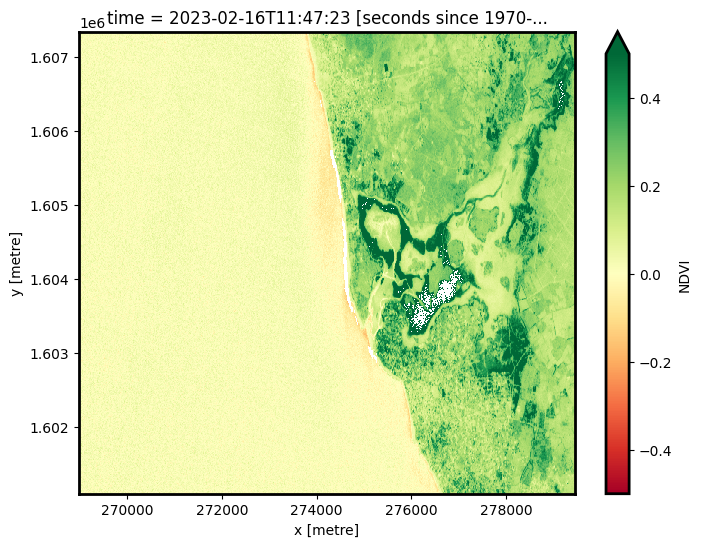

In [17]:
# Plot the resulting image for the same timestep selected above
sentinel_2_ds_low.NDVI.plot(cmap='RdYlGn',size=6, vmin=-0.5, vmax=0.5) #cmap='RdYlGn', 
plt.show()

In [18]:
# Constants for calculating waterbody area
pixel_length = query["resolution"][1]  # in metres
m_per_ha = 100  # conversion from metres to hectares

area_per_pixel = pixel_length**2 / m_per_ha**2

In [19]:
# Filter the data to contain only pixels classified as water
sentinel_2_ds_waterarea = sentinel_2_ds_high.where(sentinel_2_ds_high.NDWI > 0.0)

# Calculate the total water area (in ha)
waterarea = (
    sentinel_2_ds_waterarea.NDWI.count(dim=["x", "y"]) * area_per_pixel).persist()

   # .rolling(time=3, center=True, min_periods=1)
   # .median(skipna=True)


In [20]:
a = 0.00001
def SSII(sentinel_2_ds_high):
    return (sentinel_2_ds_high.red_edge_1) / (sentinel_2_ds_high.red + a)

In [21]:
# Calculate the NDTI value for Sentinel 2, using water extent to mask
SSII = SSII(sentinel_2_ds_waterarea)

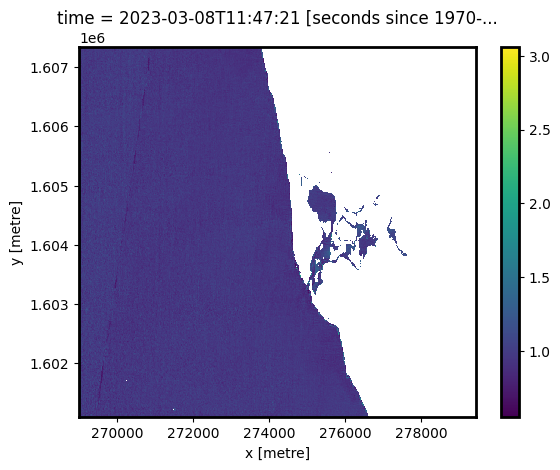

In [22]:
SSII.plot()